In [1]:
import os
import sys
import glob
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.stats import multivariate_normal,beta,dirichlet, norm
from math import log
%matplotlib inline
plt.style.use('ggplot')
np.random.seed(1234)
from scipy.special import gamma
import ternary
from numpy.linalg import inv


np.set_printoptions(formatter={'all':lambda x: '%.3f' % x})

In [2]:
sz = 50
x1 = multivariate_normal.rvs([-1.5,1.5],[[0.1,0.03],[0.03,0.1]],size=sz)
x2 = multivariate_normal.rvs([1.5,1.5],[[0.3,0.05],[0.05,0.3]],size=sz)
x3 = multivariate_normal.rvs([-1.5,-1.5],[[0.2,0.03],[0.03,0.2]],size=sz)
x4 = multivariate_normal.rvs([1.5,5],[[0.1,-0.08],[-0.08,0.1]],size=sz)
x = np.vstack((x1,x2,x3,x4))

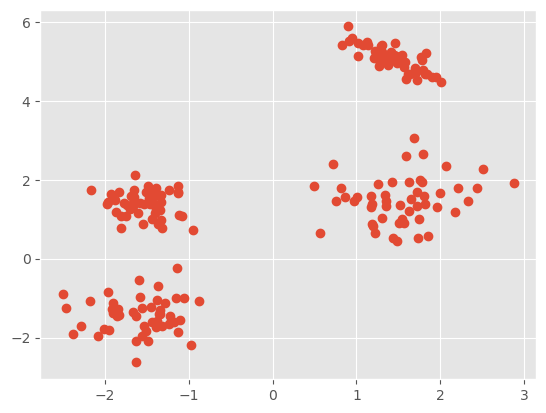

In [3]:
# plt.plot(x1[:,0],x1[:,1],'ro')
# plt.plot(x2[:,0],x2[:,1],'bo')
# plt.plot(x3[:,0],x3[:,1],'ro')
# plt.plot(x4[:,0],x4[:,1],'bo')
plt.plot(x[:,0],x[:,1],'o')

In [4]:
c_id = np.zeros(x.shape[0])
clusters,cluster_counts = np.unique(c_id,return_counts=True)
n_cluster = len(clusters)

sigma0 = np.array([[9,0],[0,9]])
mu0 = np.array([0,0])

# sigma_cluster = np.array([sigma0])
# mu_cluster = np.array([mu0])

sigma_y = np.array([[1,0],[0,1]])
tau_y = inv(sigma_y**2)
ite = 600
alpha = 5

In [5]:
# rand_x = p0.rvs(size=2*sz)

# rand_x_prob = dirichlet.pdf(rand_x,size=2*sz)

# pred_x = norm.rvs(rand_x,sigma0,size=2*sz) * rand_x_prob

In [6]:
for it in range(ite):
    for i in range(sz*2):
        print("Before calculating-------------------------------------------")
        print(f"cluster counts is:{cluster_counts}")
        print(f"number of cluster is {n_cluster}")
        assign_id = int(c_id[i])
        cluster_counts[assign_id] -= 1
        # print(f"cluster counts after minus 1 is:{cluster_counts}")
        if cluster_counts[assign_id] == 0:
            cluster_counts[assign_id] = cluster_counts[-1]
            # print(f"cluster counts after switching the last cluster element:{cluster_counts}")
            c_id[np.where(c_id==n_cluster-1)[0]] = assign_id
            cluster_counts = np.delete(cluster_counts, n_cluster-1) 
            # print(f"cluster counts after deleting the last cluster:{cluster_counts}")
            n_cluster -= 1
        c_id[i] = -1

        # print(f"This is the {it} iteration, and the {i}th element. The {assign_id}th element in the c_id")
        # print(f"After calculating-------------------------")
        # print(f"cluster counts is:{cluster_counts}")
        # print(f"number of cluster is {n_cluster}")

        logp = np.zeros((n_cluster+1))
        for j in range(n_cluster):

            idx = np.where(c_id == j)[0] # element indices within clusters[j]
            y_average = np.mean(x[idx],axis=0)
            prior_tau_j = inv(sigma0**2)
            mu_j = np.matmul((np.matmul(tau_y, y_average)*cluster_counts[j] + np.matmul(mu0 , prior_tau_j) ), inv(cluster_counts[j]* tau_y + prior_tau_j ))

            sigma_j = np.sqrt(inv(cluster_counts[j]* tau_y + prior_tau_j ) + sigma_y**2)

            logp[j] = np.log(cluster_counts[j]/(sz*2-1+alpha)) + multivariate_normal.logpdf(x[i],mu_j,sigma_j)

        new_cluster_mu = mu0
        new_cluster_sigma = np.sqrt(sigma0**2+sigma_y**2)
        
        logp[-1] = np.log(alpha/(sz*2-1+alpha)) + multivariate_normal.logpdf(x[i],new_cluster_mu,new_cluster_sigma)
        print(f"logp is:{logp}")
        logp_max = np.max(logp)
        logp = logp - logp_max
        p = np.exp(logp)
        p = p/np.sum(p)
        print(f"p is:{p}")        
        new_c = np.random.choice(np.arange(n_cluster+1),p=p)
        print(f"new class is : {new_c}")
        if new_c == n_cluster:
            # clusters = np.append(clusters,new_c)
            n_cluster += 1
            cluster_counts = np.append(cluster_counts,1)
        else:
            cluster_counts[new_c] += 1
        c_id[i] = new_c



Before calculating-------------------------------------------
cluster counts is:[200.000]
number of cluster is 1
logp is:[-2.232 -7.258]
p is:[0.993 0.007]
new class is : 0
Before calculating-------------------------------------------
cluster counts is:[200.000]
number of cluster is 1
logp is:[-2.919 -7.320]
p is:[0.988 0.012]
new class is : 0
Before calculating-------------------------------------------
cluster counts is:[200.000]
number of cluster is 1
logp is:[-2.267 -7.386]
p is:[0.994 0.006]
new class is : 0
Before calculating-------------------------------------------
cluster counts is:[200.000]
number of cluster is 1
logp is:[-2.528 -7.292]
p is:[0.992 0.008]
new class is : 0
Before calculating-------------------------------------------
cluster counts is:[200.000]
number of cluster is 1
logp is:[-1.895 -7.205]
p is:[0.995 0.005]
new class is : 0
Before calculating-------------------------------------------
cluster counts is:[200.000]
number of cluster is 1
logp is:[-3.115 -7.399

In [7]:
mu_j = np.zeros((n_cluster,2))
delta_j = np.zeros((n_cluster,2,2))
for j in range(n_cluster):

    idx = np.where(c_id == j)[0] # element indices within clusters[j]
    y_average = np.mean(x[idx],axis=0)
    prior_tau_j = inv(sigma0**2)
    mu_j[j] = np.matmul((np.matmul(tau_y, y_average)*cluster_counts[j] + np.matmul(mu0 , prior_tau_j) ), inv(cluster_counts[j]* tau_y + prior_tau_j ))
    delta_j[j] = (mu0+ sigma0 + np.sum( (x[idx]-mu_j[j])**2,axis=0 ) / (cluster_counts[j]+2-2-1) )
print(mu_j)
print(delta_j)
    


[[-0.180 1.642]
 [1.679 1.229]
 [2.413 1.834]
 [1.674 1.413]]
[[[11.357 5.926]
  [2.357 14.926]]

 [[9.064 0.275]
  [0.064 9.275]]

 [[9.008 0.168]
  [0.008 9.168]]

 [[9.170 0.051]
  [0.170 9.051]]]


In [8]:
print(mu_j)
print(cluster_counts)

[[-0.180 1.642]
 [1.679 1.229]
 [2.413 1.834]
 [1.674 1.413]]
[186.000 7.000 3.000 4.000]


0
1
2
3


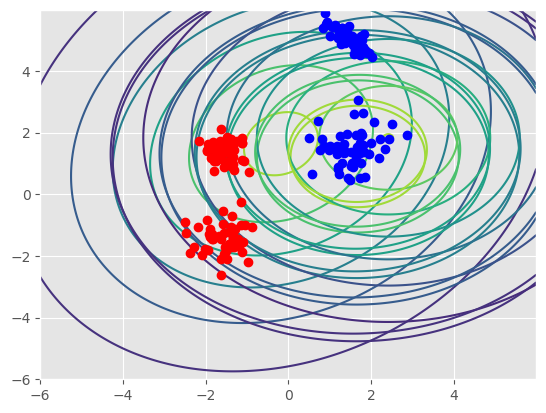

In [13]:
x,y = np.mgrid[-6:6:0.01,-6:6:0.01]
pos = np.dstack((x,y))
id_vector = range(n_cluster)
plt.figure()
for i in id_vector:
    print(i)
    rv1 = multivariate_normal(mean = mu_j[i,:],cov = delta_j[i,:])
    # rv2 = multivariate_normal(mean = mu_j,cov = delta_j)

    plt.contour(x,y,rv1.pdf(pos))
    # plt.contour(x,y,rv2.pdf(pos))\
plt.plot(x1[:,0],x1[:,1],'ro')
plt.plot(x2[:,0],x2[:,1],'bo')
plt.plot(x3[:,0],x3[:,1],'ro')
plt.plot(x4[:,0],x4[:,1],'bo')

In [10]:
# start = 0
# scale = 10
# for i in range(start, scale + (1 - start)):
#     for j in range(start, scale + (1 - start) - i):
#         k = scale - i - j
#         print(i, j, k)

In [11]:
# # showcasing Dirichlet distribution
# def f(x):
#     return x[0]**(a1-1) * x[1]**(a2-1) * x[2]**(a3-1)/beta

# scale = 60
# fig, tax = ternary.figure(scale=scale)
# tax.heatmapf(f,scale=scale)

In [12]:
# def shannon_entropy(p):
#     """Computes the Shannon Entropy at a distribution in the simplex."""
#     s = 0.
#     for i in range(len(p)):
#         try:
#             s += p[i] * log(p[i])
#         except ValueError:
#             continue
#     return -1.*s
# scale = 60

# figure, tax = ternary.figure(scale=scale)
# tax.heatmapf(shannon_entropy, boundary=True, style="triangular")
# tax.boundary(linewidth=2.0)
# tax.set_title("Shannon Entropy Heatmap")

# tax.show()